In [23]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

pylab imported
The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [33]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
from mpl_toolkits.mplot3d import Axes3D
from skimage import measure


import numpy as np
from ase.units import Bohr
from ase.io.cube import read_cube_data

from cube2xyz import cube2xyz
from cube2xyz import plotSection2D


# Example for isosurface visualization

In [3]:
def fun(x, y, z):
    return np.cos(x) + np.cos(y) + np.cos(z)

x, y, z = np.pi*np.mgrid[-1:1:31j, -1:1:31j, -1:1:31j]
vol = fun(x, y, z)

In [4]:
x.shape

(31, 31, 31)

In [5]:
vol.shape

(31, 31, 31)

In [6]:
# https://stackoverflow.com/questions/6030098/how-to-display-a-3d-plot-of-a-3d-array-isosurface-in-matplotlib-mplot3d-or-simil
# http://scikit-image.org/docs/dev/auto_examples/edges/plot_marching_cubes.html
verts, faces, normals, values = measure.marching_cubes(vol, 0, spacing=(0.1, 0.1, 0.1))


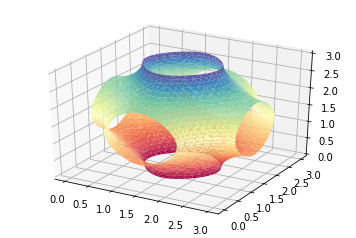

In [7]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.plot_trisurf(verts[:, 0], verts[:,1], faces, verts[:, 2],
                cmap='Spectral', lw=1)
plt.show()

# cube file visualization

In [8]:
infile_cube = 'sandbox/h2o.vHtg.cube'
cube_data, cube_atoms = read_cube_data(infile_cube)

In [9]:
cube_data.ndim

3

In [10]:
cube_atoms.cell

array([[ 4.99998803,  0.        ,  0.        ],
       [ 0.        ,  4.99998803,  0.        ],
       [ 0.        ,  0.        ,  4.99998803]])

In [11]:
cube_data.shape

(48, 48, 48)

In [12]:
X_lin = []

for i in range(0,cube_data.ndim):
    X_lin.append( np.linspace(0, cube_atoms.cell[i,i], cube_data.shape[i] ) )

X_list=np.meshgrid(*X_lin,indexing='ij')
X_grid = np.asarray(X_list)


In [13]:
X_grid.shape

(3, 48, 48, 48)

In [14]:
cube_data.max()

0.064472589999999996

In [15]:
cube_data.min()

-9.8875250000000001

In [16]:
verts, faces, normals, values = measure.marching_cubes(cube_data, -0.1, spacing=(0.1, 0.1, 0.1))

In [17]:
verts, faces, normals, values = measure.marching_cubes(cube_data, -0.1)

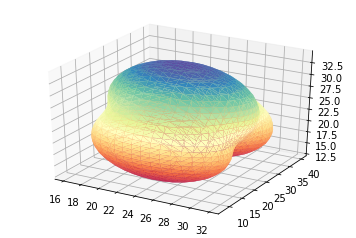

In [18]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.plot_trisurf(verts[:, 0], verts[:,1], faces, verts[:, 2],
                cmap='Spectral', lw=1)
plt.show()

In [19]:
P=6
stride=(cube_data.max() - cube_data.min())/P
cols = 2
rows = round((P+1)/cols)
fig = plt.figure(figsize=(cols*8,rows*5))
for p in range(0,P):
    pos = rows*100+cols*10+p+1
    ax = fig.add_subplot(pos,projection='3d')
    phi = cube_data.min() + round(stride*(p+0.5))
    verts, faces, normals, values = measure.marching_cubes(cube_data, phi, spacing=(0.1, 0.1, 0.1))
    ax.plot_trisurf(verts[:, 0], verts[:,1], faces, verts[:, 2],
                cmap='Spectral', lw=1)

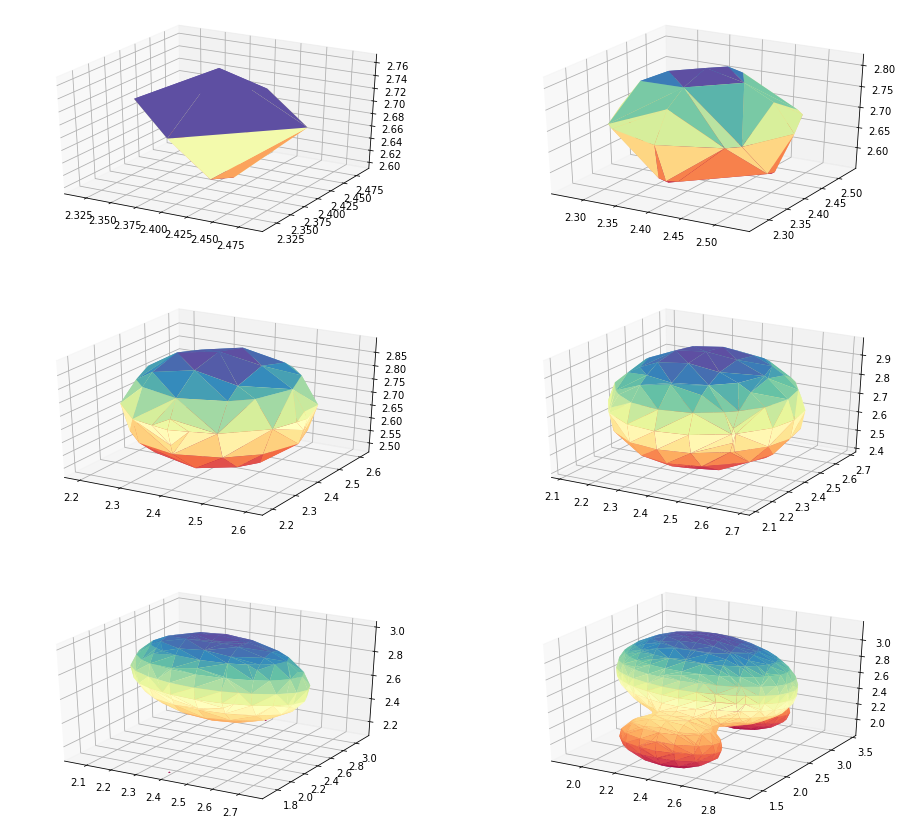

In [20]:
fig

In [21]:
cube_data.shape

(48, 48, 48)

In [22]:
cube_data.min()

-9.8875250000000001

In [23]:
cube_data.max()

0.064472589999999996

In [24]:
np.log(10)

2.3025850929940459

In [25]:
pot_span = cube_data.max()-cube_data.min()

In [26]:
pot_span

9.9519975899999995

In [27]:
offset = 1

In [28]:
margin = pot_span * 0.01

In [29]:
base = 100

In [30]:
exponents = np.linspace(0+margin,np.log(pot_span+offset-margin),P)/np.log(base)

In [31]:
exponents

array([ 0.02161049,  0.12084128,  0.22007207,  0.31930286,  0.41853366,
        0.51776445])

In [32]:
levels = base**exponents-offset

In [33]:
levels

array([ 0.10464054,  0.74454654,  1.755143  ,  3.35116678,  5.87174942,
        9.85247761])

In [34]:
isopots = cube_data.max() - levels

In [35]:
isopots

array([-0.04016795, -0.68007395, -1.69067041, -3.28669419, -5.80727683,
       -9.78800502])

In [36]:
cube_data.max()

0.064472589999999996

In [37]:
cube_data.min()

-9.8875250000000001

# AMBER water example

In [38]:
infile_cube = 'sandbox/esp_wat.gesp.cube.99999'
cube_data, cube_atoms = read_cube_data(infile_cube)
P=6
offset = 1
pot_span = cube_data.max()-cube_data.min()
margin = pot_span * 0.01
base = 10
exponents = np.linspace(0+margin,np.log(pot_span+offset-margin),P)/np.log(base)
levels = base**exponents-offset
isopots = cube_data.max() - levels
cols = 2
rows = round((P+1)/cols)

In [39]:
exponents

array([ 0.00032081,  0.0063871 ,  0.0124534 ,  0.0185197 ,  0.024586  ,
        0.03065229])

In [40]:
isopots

array([ 0.03105847,  0.0169819 ,  0.00270733, -0.01176804, -0.02644701,
       -0.04133246])

In [41]:
fig = plt.figure(figsize=(cols*8,rows*5))
for p in range(0,P):
    pos = rows*100+cols*10+p+1
    ax = fig.add_subplot(pos,projection='3d')
    #phi = cube_data.min() + round(stride*(p+0.5))
    verts, faces, normals, values = \
        measure.marching_cubes(cube_data, isopots[p])
    ax.set_title("phi = {:.3e}".format(isopots[p]))
    ax.plot_trisurf(verts[:, 0], verts[:,1], faces, verts[:, 2],
                cmap='Spectral', lw=1)

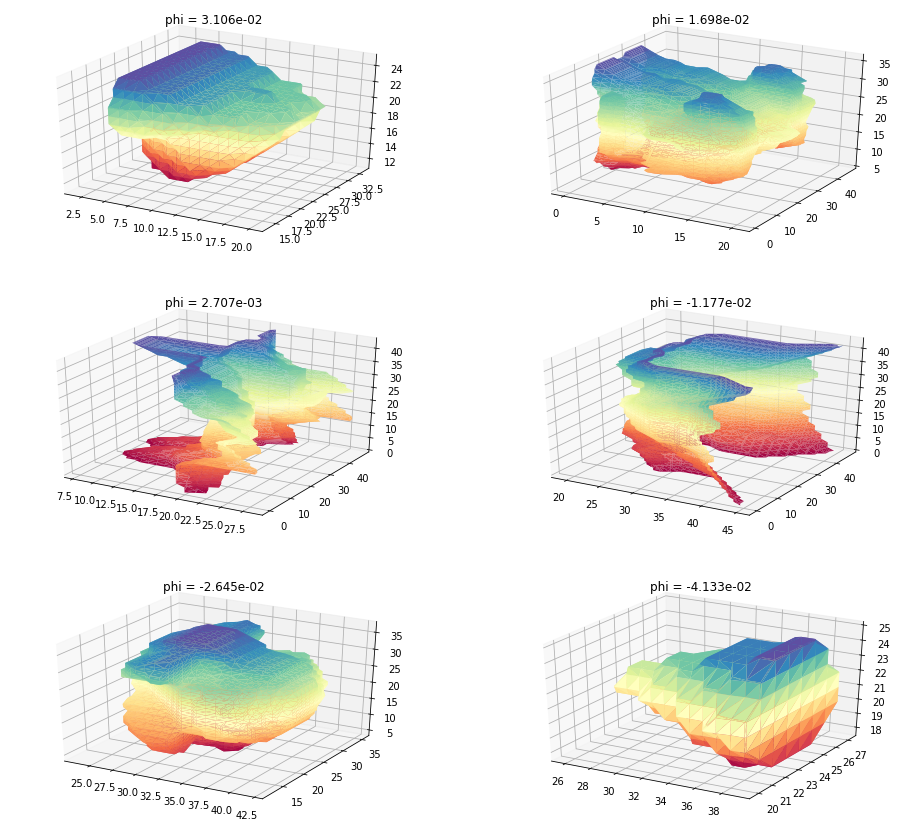

In [42]:
fig

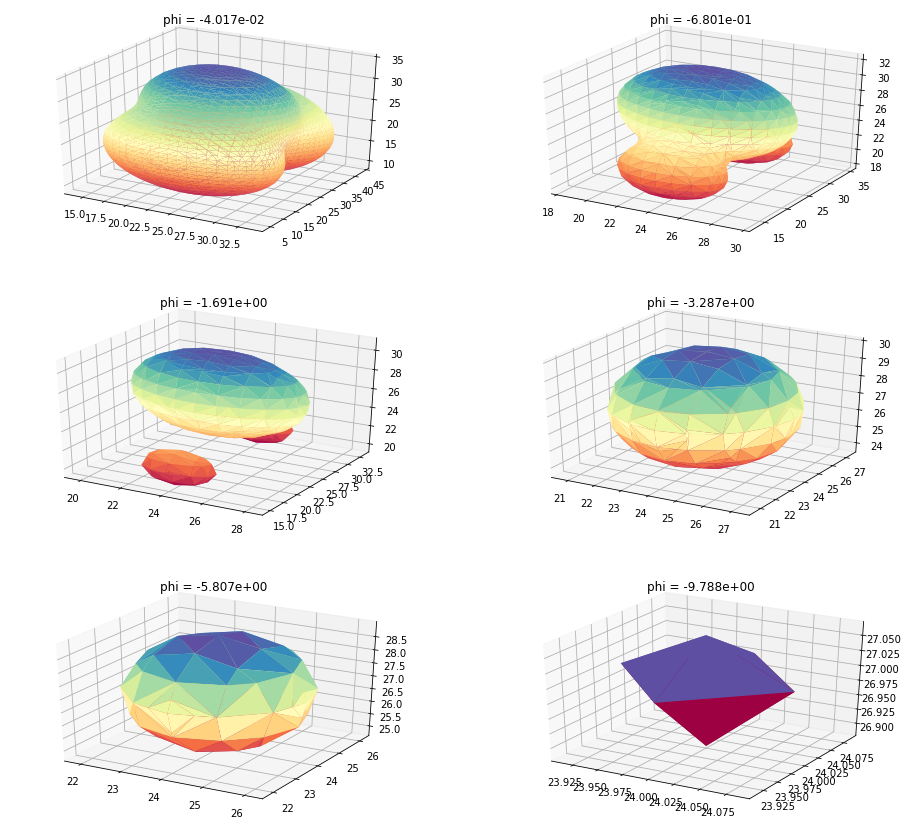

In [43]:
infile_cube = 'sandbox/h2o.vHtg.cube'
cube_data, cube_atoms = read_cube_data(infile_cube)

P=6
offset = 1
pot_span = cube_data.max()-cube_data.min()
margin = pot_span * 0.01
base = 10
exponents = np.linspace(0+margin,np.log(pot_span+offset-margin),P)/np.log(base)
levels = base**exponents-offset
isopots = cube_data.max() - levels
cols = 2
rows = round((P+1)/cols)

fig = plt.figure(figsize=(cols*8,rows*5))
for p in range(0,P):
    pos = rows*100+cols*10+p+1
    ax = fig.add_subplot(pos,projection='3d')
    #phi = cube_data.min() + round(stride*(p+0.5))
    verts, faces, normals, values = \
        measure.marching_cubes(cube_data, isopots[p])
    ax.set_title("phi = {:.3e}".format(isopots[p]))
    ax.plot_trisurf(verts[:, 0], verts[:,1], faces, verts[:, 2],
                cmap='Spectral', lw=1)
    
fig


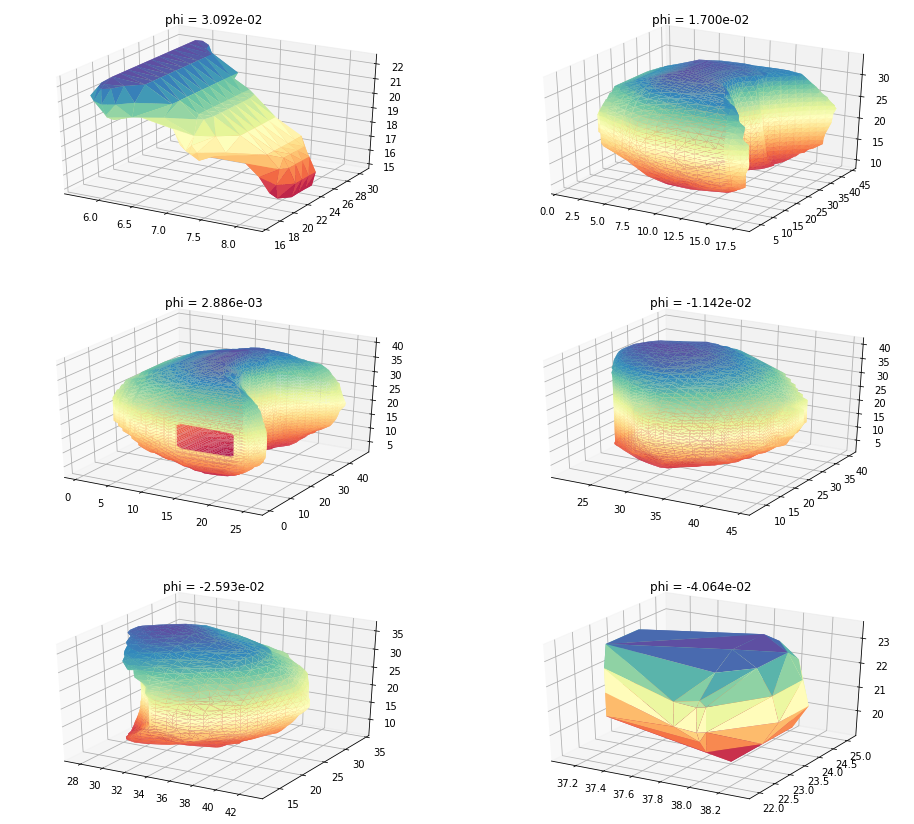

In [44]:
infile_cube = 'sandbox/esp_wat.gesp.cube.99999.lin'
cube_data, cube_atoms = read_cube_data(infile_cube)

P=6
offset = 1
pot_span = cube_data.max()-cube_data.min()
margin = pot_span * 0.01
base = 10
exponents = np.linspace(0+margin,np.log(pot_span+offset-margin),P)/np.log(base)
levels = base**exponents-offset
isopots = cube_data.max() - levels
cols = 2
rows = round((P+1)/cols)

fig = plt.figure(figsize=(cols*8,rows*5))
for p in range(0,P):
    pos = rows*100+cols*10+p+1
    ax = fig.add_subplot(pos,projection='3d')
    #phi = cube_data.min() + round(stride*(p+0.5))
    verts, faces, normals, values = \
        measure.marching_cubes(cube_data, isopots[p])
    ax.set_title("phi = {:.3e}".format(isopots[p]))
    ax.plot_trisurf(verts[:, 0], verts[:,1], faces, verts[:, 2],
                cmap='Spectral', lw=1)
    
fig


# cube slice visualization
modification of

https://github.com/julenl/molecular_modeling_scripts/tree/master/cube2xyz

http://larrucea.eu/cube2xyz/

pylab imported


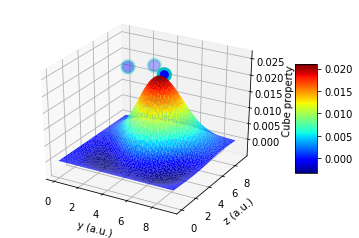

In [8]:
test_fig = cube2xyz('sandbox/h2o.vHtg.cube', x_coord=1, output=False, mpl=True)

In [9]:
test_fig

In [10]:
test_fig.axes

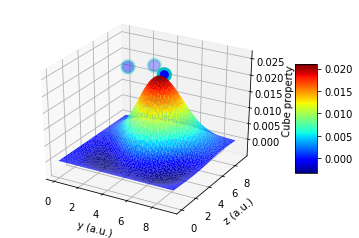

In [11]:
test_fig.figure

In [30]:
infile_cube = 'sandbox/h2o.vHtg.cube'
cube_data, cube_atoms = read_cube_data(infile_cube)
X = cube_atoms.cell.diagonal()/Bohr

In [31]:
X

array([ 9.448608,  9.448608,  9.448608])

In [15]:
# plot yz
dim = 0
P=5
#L = X.shape[3]
margin = 1e-1 * X[dim]
x = np.linspace(margin,X[dim]-margin,P)
x

array([ 0.9448608,  2.8345824,  4.724304 ,  6.6140256,  8.5037472])

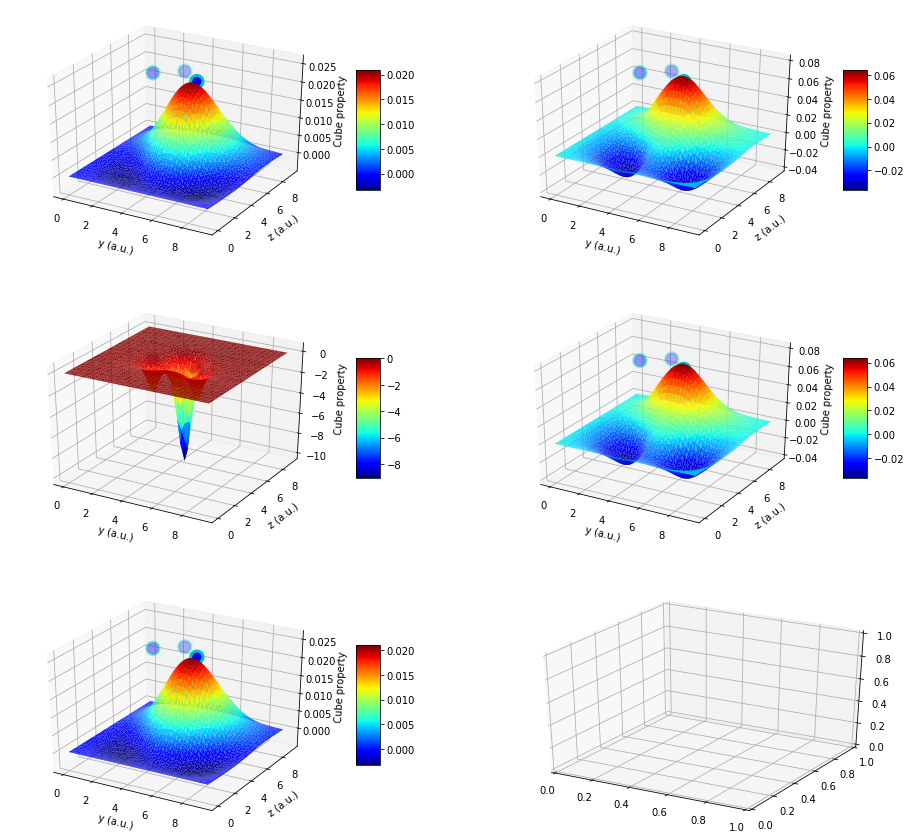

In [16]:
cols = 2
rows = round((P+1)/cols)
# fig = plt.figure(figsize=(cols*8,rows*5),projection='3d')

fig, axes = plt.subplots(rows,cols,figsize=(cols*8,rows*5),subplot_kw={'projection':'3d'})
p = 0
for i in range(rows):
    for j in range(cols):
        if p < P:
            cube2xyz('sandbox/h2o.vHtg.cube', x_coord=x[p],output=False, mpl=True,ax=axes[i,j])
            p += 1
        else:
            break

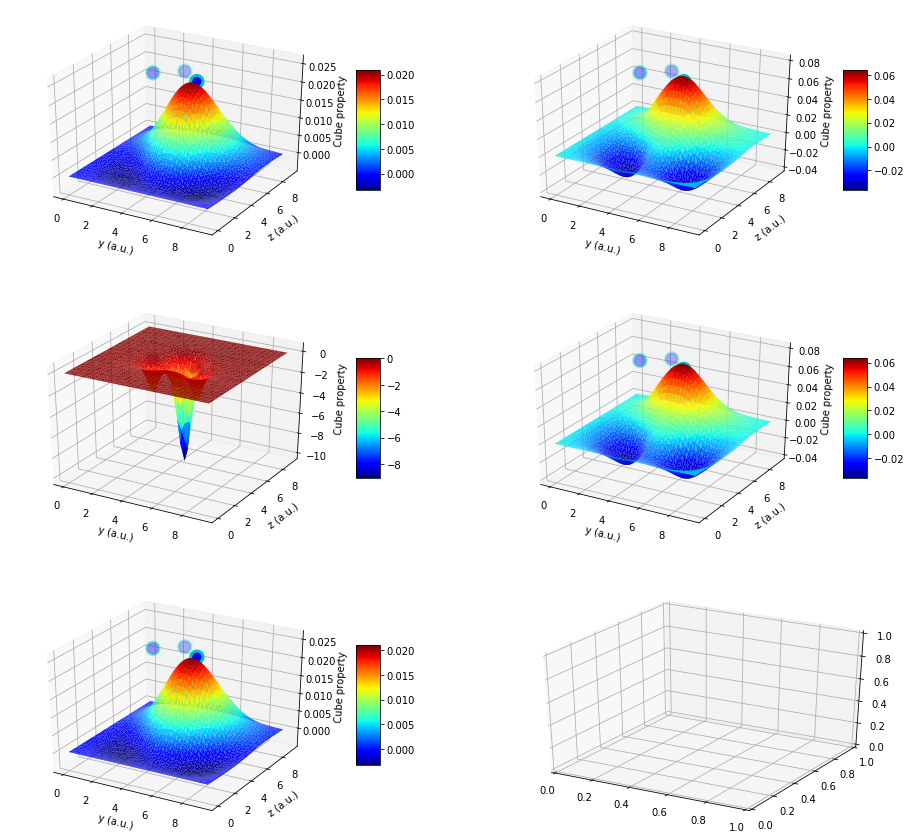

In [19]:
fig

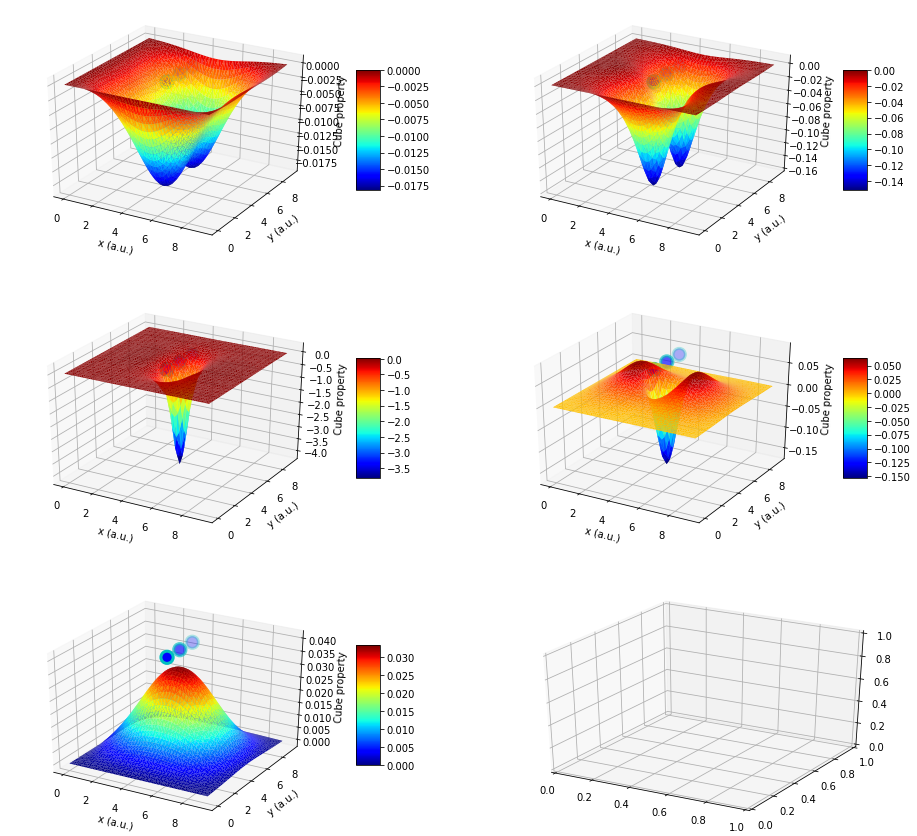

In [20]:
# plot xy
dim = 2
P=5
#L = X.shape[3]
margin = 1e-1 * X[dim]
x = np.linspace(margin,X[dim]-margin,P)
cols = 2
rows = round((P+1)/cols)
# fig = plt.figure(figsize=(cols*8,rows*5),projection='3d')

fig, axes = plt.subplots(rows,cols,figsize=(cols*8,rows*5),subplot_kw={'projection':'3d'})
p = 0
for i in range(rows):
    for j in range(cols):
        if p < P:
            cube2xyz('sandbox/h2o.vHtg.cube', z_coord=x[p],output=False, mpl=True,ax=axes[i,j])
            p += 1
        else:
            break

pylab imported


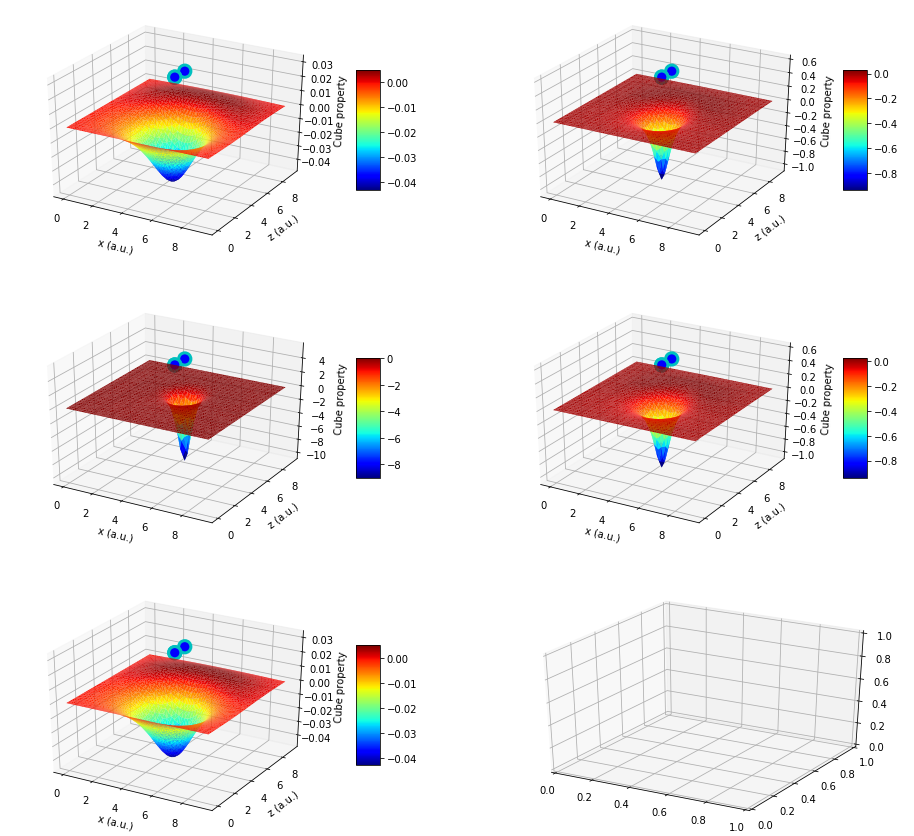

In [27]:
# plot xz
dim = 1
P=5
#L = X.shape[3]
margin = 1e-1 * X[dim]
x = np.linspace(margin,X[dim]-margin,P)
cols = 2
rows = round((P+1)/cols)
# fig = plt.figure(figsize=(cols*8,rows*5),projection='3d')

fig, axes = plt.subplots(rows,cols,figsize=(cols*8,rows*5),subplot_kw={'projection':'3d'})
p = 0
for i in range(rows):
    for j in range(cols):
        if p < P:
            cube2xyz('sandbox/h2o.vHtg.cube', y_coord=x[p],output=False, mpl=True,ax=axes[i,j])
            p += 1
        else:
            break

In [34]:
infile_cube = 'sandbox/h2o.vHtg.cube'
cube_data, cube_atoms = read_cube_data(infile_cube)
X = cube_atoms.cell.diagonal()/Bohr
X.shape

(3,)

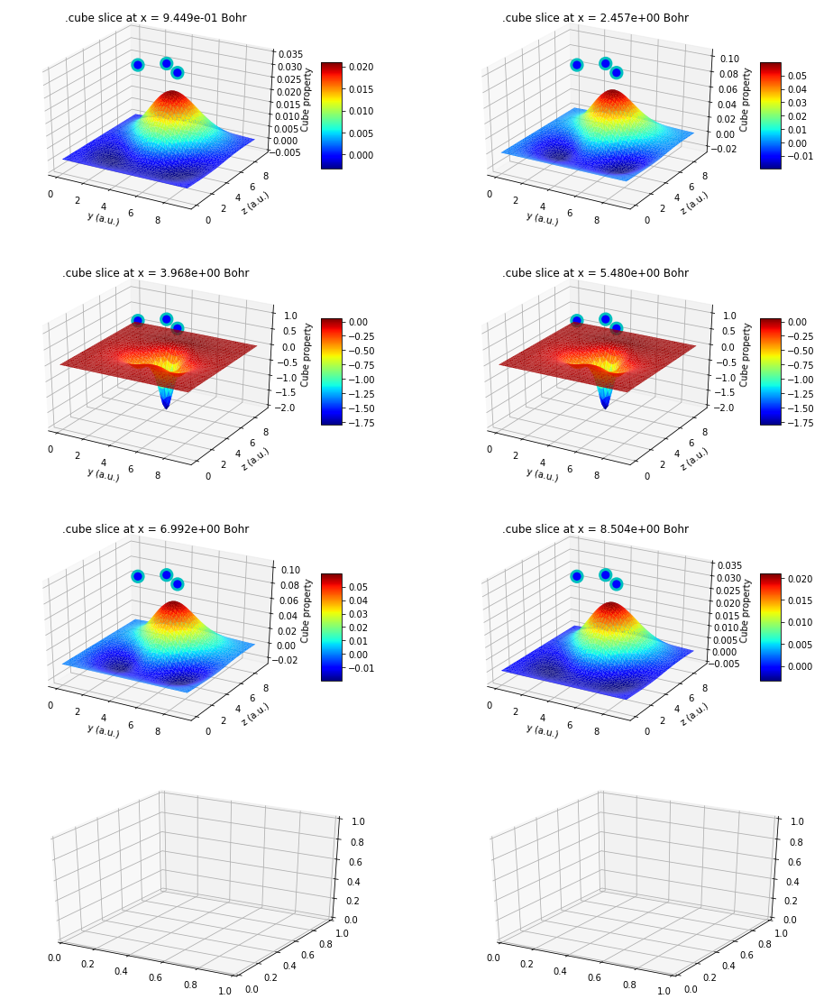

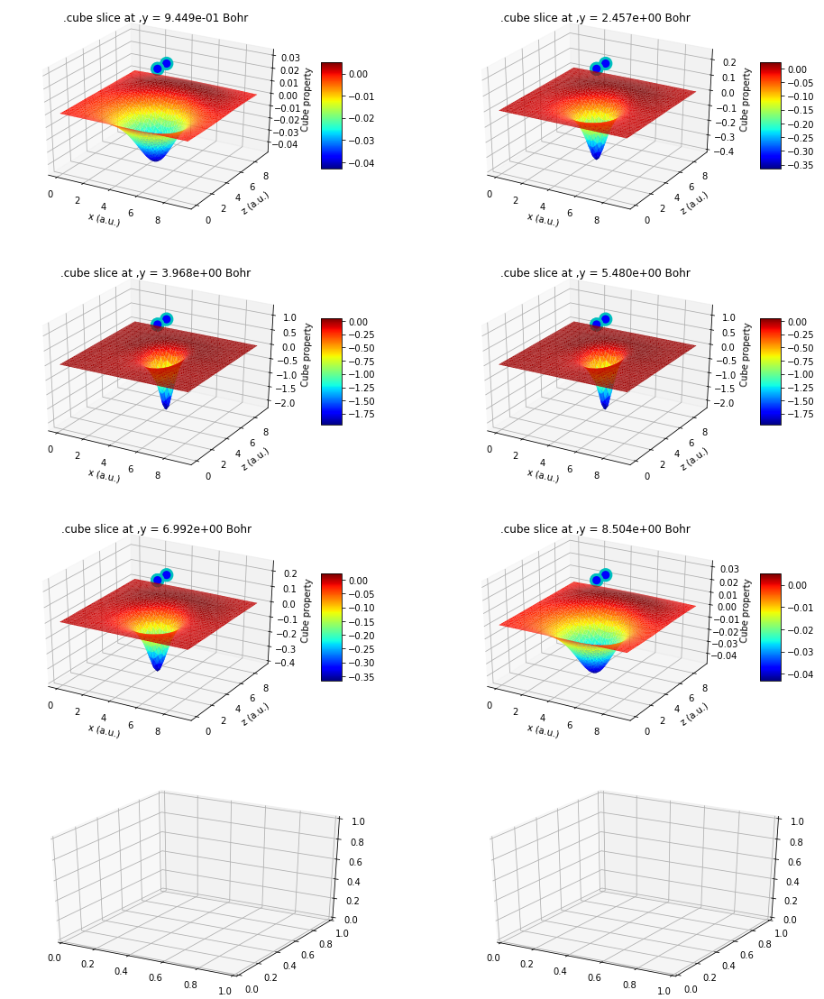

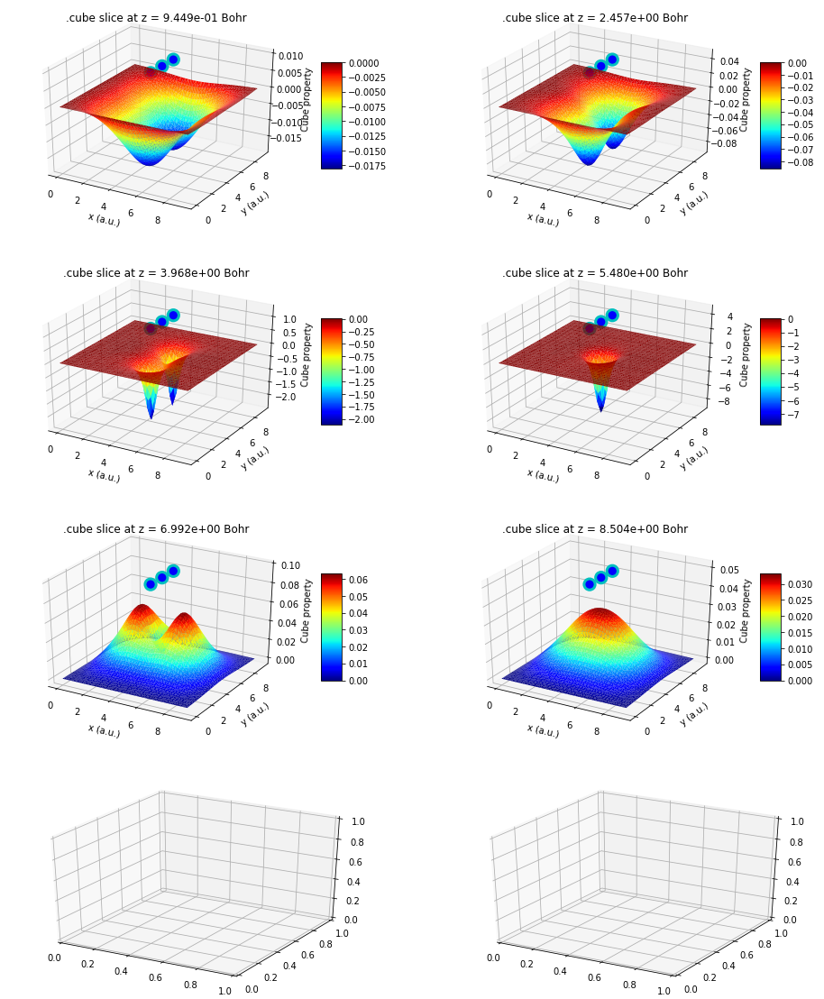

In [40]:
P=6
margin = 1e-1 * X
cols = 2
rows = round((P+1)/cols)

fig = []
axes = []
dim_label= ["x",",y","z"]
for dim in range(X.shape[0]):
    #L = X.shape[3]
    x = np.linspace(margin[dim],X[dim]-margin[dim],P)

    tmp_fig, tmp_axes = plt.subplots(rows,cols,figsize=(cols*8,rows*5),subplot_kw={'projection':'3d'})
    p = 0
    for i in range(rows):
        for j in range(cols):
            if p < P:
                tmp_ax = plotSection2D(infile_cube, x[p], axis=dim, ax=tmp_axes[i,j])
                tmp_ax.set_title(".cube slice at {} = {:.3e} Bohr".format(dim_label[dim],x[p]))
                #cube2xyz(infile_cube, y_coord=x[p],output=False, mpl=True,ax=axes[i,j])
                p += 1
            else:
                break
                
    fig.append(tmp_fig)
    axes.append(tmp_axes)

In [41]:
fig

In [42]:
axes

[array([[<matplotlib.axes._subplots.Axes3DSubplot object at 0x7fddcc30d198>,
         <matplotlib.axes._subplots.Axes3DSubplot object at 0x7fddc79f8908>]], dtype=object),
 array([[<matplotlib.axes._subplots.Axes3DSubplot object at 0x7fddcfae30b8>,
         <matplotlib.axes._subplots.Axes3DSubplot object at 0x7fddc7749860>]], dtype=object),
 array([[<matplotlib.axes._subplots.Axes3DSubplot object at 0x7fddc72f74e0>,
         <matplotlib.axes._subplots.Axes3DSubplot object at 0x7fddc7235cf8>]], dtype=object)]

In [43]:
def sliceCubeXYZ(infile_cube, sections=6, margin_relative=1e-1,cols=2,width=8,height=5):
    cube_data, cube_atoms = read_cube_data(infile_cube)
    X = cube_atoms.cell.diagonal()/Bohr
    margin = margin_relative * X
    #cols = 2
    rows = round(sections/cols)

    fig = []
    axes = []
    dim_label= ["x",",y","z"]
    for dim in range(X.shape[0]):
        #L = X.shape[3]
        x = np.linspace(margin[dim],X[dim]-margin[dim],sections)

        tmp_fig, tmp_axes = plt.subplots(rows,cols,figsize=(cols*width,rows*height),subplot_kw={'projection':'3d'})
        p = 0
        for i in range(rows):
            for j in range(cols):
                if p < sections:
                    tmp_ax = plotSection2D(infile_cube, x[p], axis=dim, ax=tmp_axes[i,j])
                    tmp_ax.set_title(".cube slice at {} = {:.3e} Bohr".format(dim_label[dim],x[p]))
                    #cube2xyz(infile_cube, y_coord=x[p],output=False, mpl=True,ax=axes[i,j])
                    p += 1
                else:
                    break

        fig.append(tmp_fig)
        axes.append(tmp_axes)
        
    return fig

In [127]:
def isosurfCubeLog(infile_cube, sections=6, margin=1e-2,cols=2,width=8,height=5,sign=1.0,base=10,interval=[]):
    cube_data, cube_atoms = read_cube_data(infile_cube)
    
    cube_data = cube_data * sign
    
    data_span = cube_data.max()-cube_data.min()
    print("Data maximum {}.".format(cube_data.max()))
    print("Data minimum {}.".format(cube_data.min()))


    print("Span of data {}.".format(data_span))

    data_offset = cube_data.min() - 1
    print("Shift data by {}.".format(data_offset))
    
    #normalized_data = (cube_data - data_offset)
    cube_log_data = np.log(cube_data - data_offset ) / np.log(base)
    data_log_max = cube_log_data.max() 
    data_log_span = cube_log_data.max() - cube_log_data.min()
    print("Span of logarithms: {}.".format(data_log_span))
    print("Magnitude of logarithm: {}.".format(data_log_max))

    normalized_log_data = cube_log_data / data_log_max
    # margin = data_log_span * margin_relative
    if not interval:
        interval = [ normalized_log_data.min(), normalized_log_data.max() ]
        
    print("Plot isosurfaces of normalized log values in interval {}".format(interval))
    normalized_log_iso_vals = np.linspace(interval[0]+margin,interval[1]-margin,sections)

    iso_vals = (base**(normalized_log_iso_vals*data_log_max) + data_offset)*sign
    #exponents = np.linspace(0+margin,np.log(data_span+offset-margin)/np.log(base),P)
    #levels = base**exponents-offset
    #if sign < 0: # descending order
    #    isopots = cube_data.max() - levels
    #else: # ascending order
    #    isopots = cube_data.min() + levels
     
    rows = round(sections/cols)

    fig, axes = plt.subplots(rows,cols,figsize=(cols*width,rows*height),subplot_kw={'projection':'3d'})
    p = 0
    for i in range(rows):
        for j in range(cols):
            if p < sections:
                #tmp_ax = fig.add_subplot(pos,projection='3d')
                #phi = cube_data.min() + round(stride*(p+0.5))
                verts, faces, normals, values = \
                    measure.marching_cubes(normalized_log_data, normalized_log_iso_vals[p])
                axes[i,j].set_title("isosurface at val = {:.3g}".format(iso_vals[p]))
                axes[i,j].plot_trisurf(verts[:, 0], verts[:,1], faces, verts[:, 2],
                            cmap='Spectral', lw=1)
                p += 1
            else: 
                break
        
    return fig

## GPAW Water test, potential

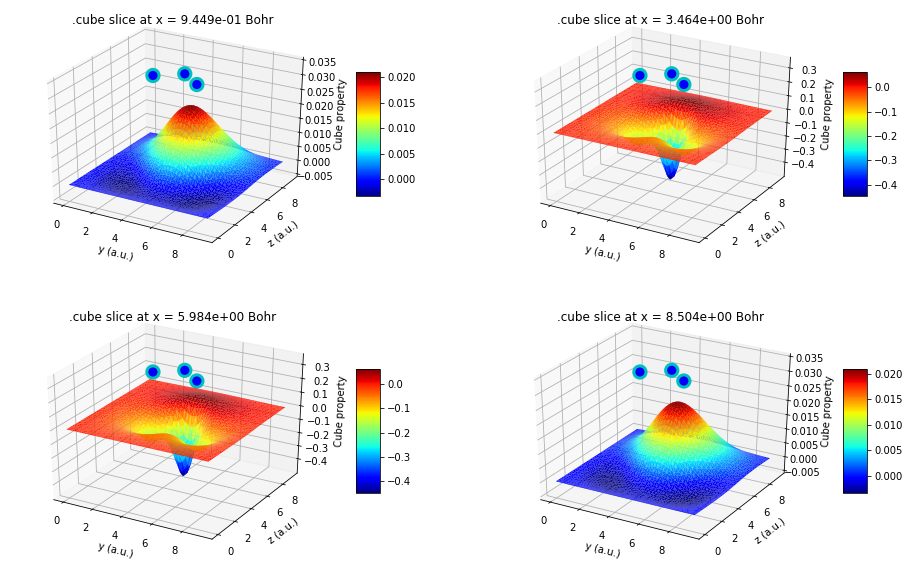

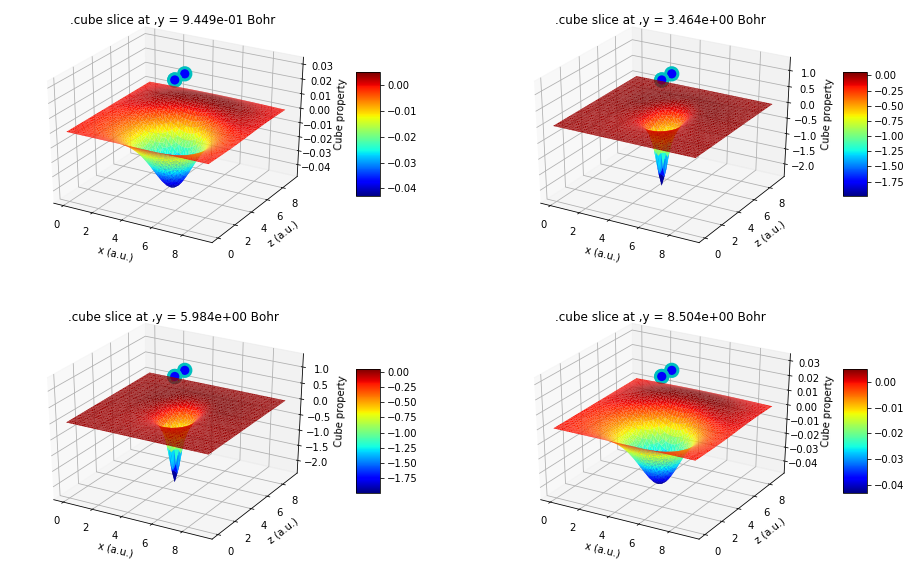

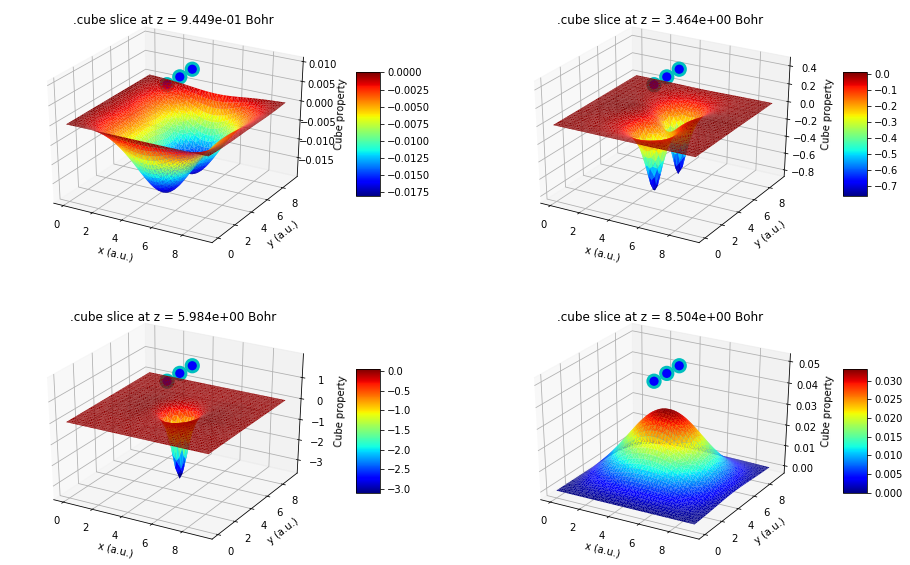

In [139]:
fig_tmp = sliceCubeXYZ('sandbox/h2o.vHtg.cube',sections=4)

Data maximum 0.06447259.
Data minimum -9.887525.
Span of data 9.95199759.
Shift data by -10.887525.
Span of logarithms: 1.0394933395589305.
Magnitude of logarithm: 1.0394933395589305.
Plot isosurfaces of normalized log values in interval [0.7, 1]


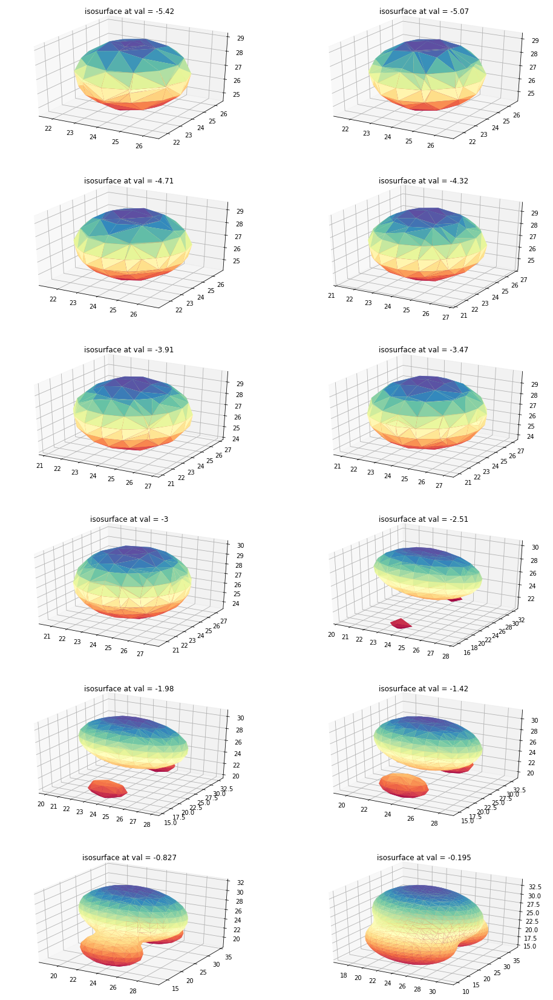

In [138]:
fig_tmp = isosurfCubeLog('sandbox/h2o.vHtg.cube',sections=12,interval=[0.7,1])

## GPAW Water test, electron density

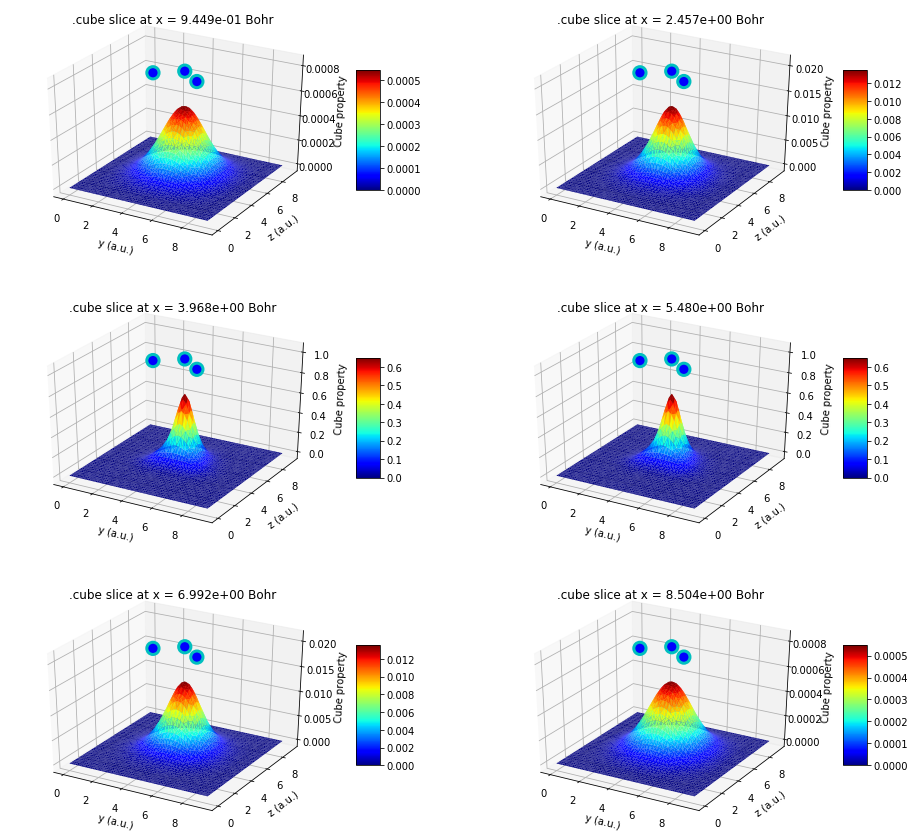

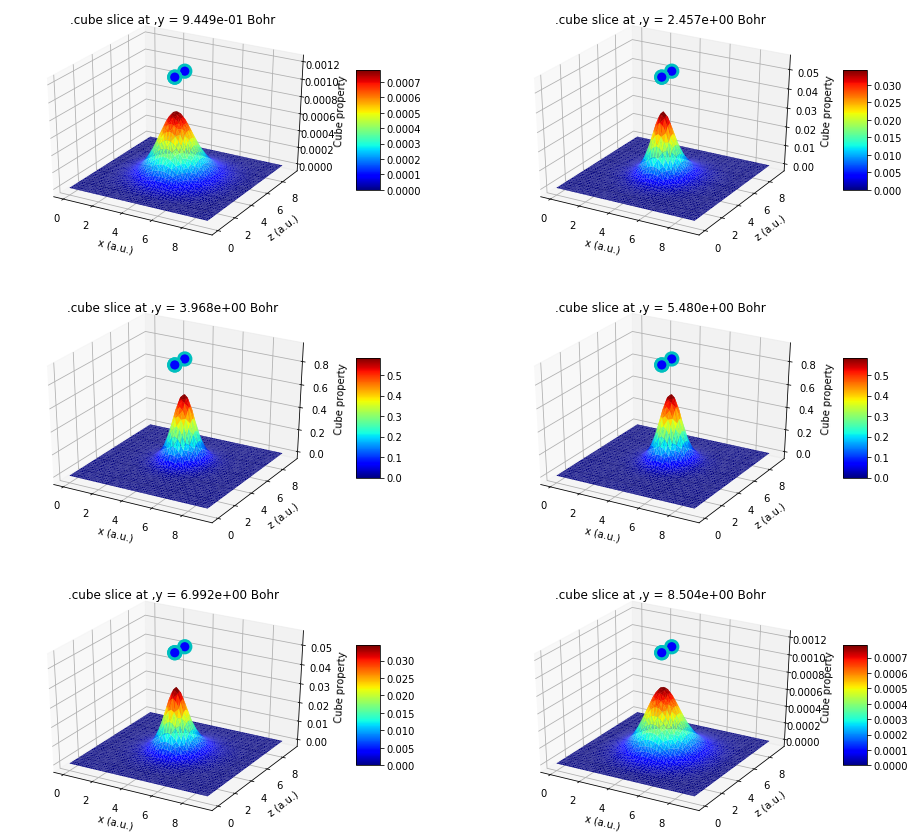

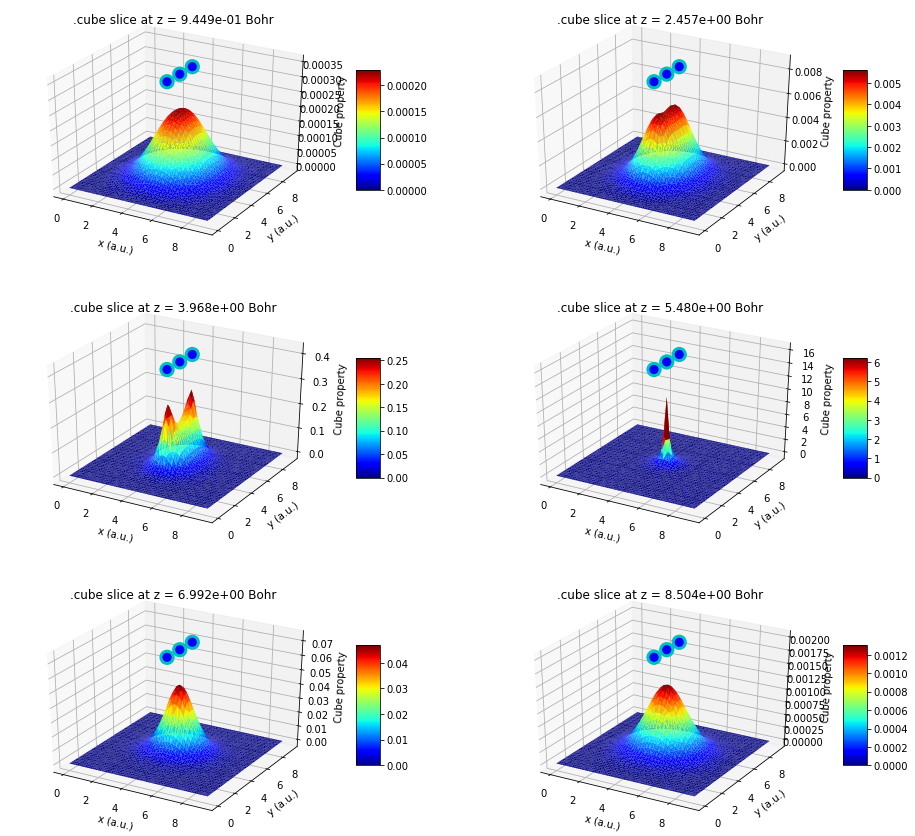

In [141]:
figWaterGPAW_rho = sliceCubeXYZ('examples/h2o.rho.cube')


Data maximum 100.0259.
Data minimum 0.0.
Span of data 100.0259.
Shift data by -1.0.
Span of logarithms: 2.004432728090609.
Magnitude of logarithm: 2.004432728090609.
Plot isosurfaces of normalized log values in interval [0, 0.1]


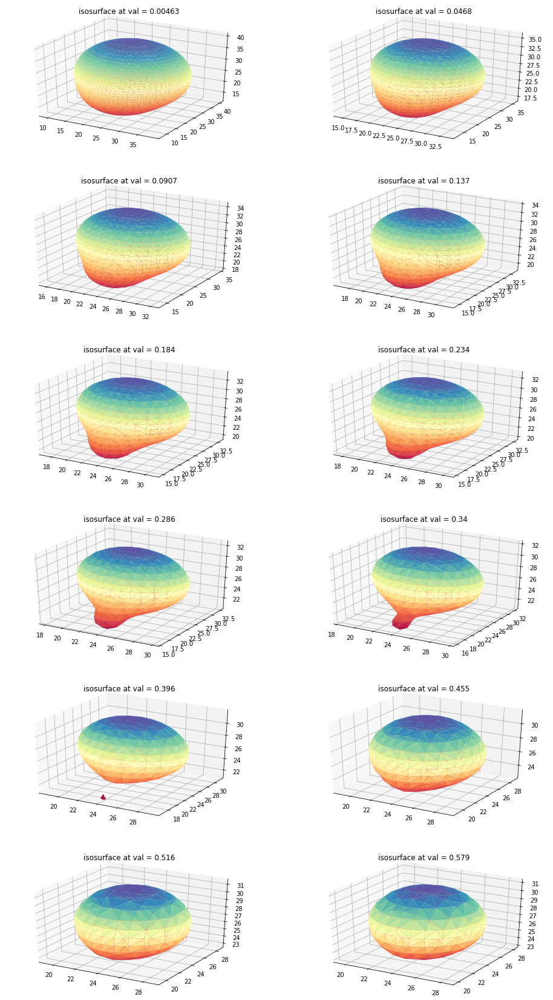

In [143]:
figWaterGPAW_rhoDescending = isosurfCubeLog('examples/h2o.rho.cube',margin=1e-3,interval=[0,0.1],sections=12)


Data maximum -0.0.
Data minimum -100.0259.
Span of data 100.0259.
Shift data by -101.0259.
Span of logarithms: 2.004432728090609.
Magnitude of logarithm: 2.004432728090609.
Plot isosurfaces of normalized log values in interval [0.997, 1]


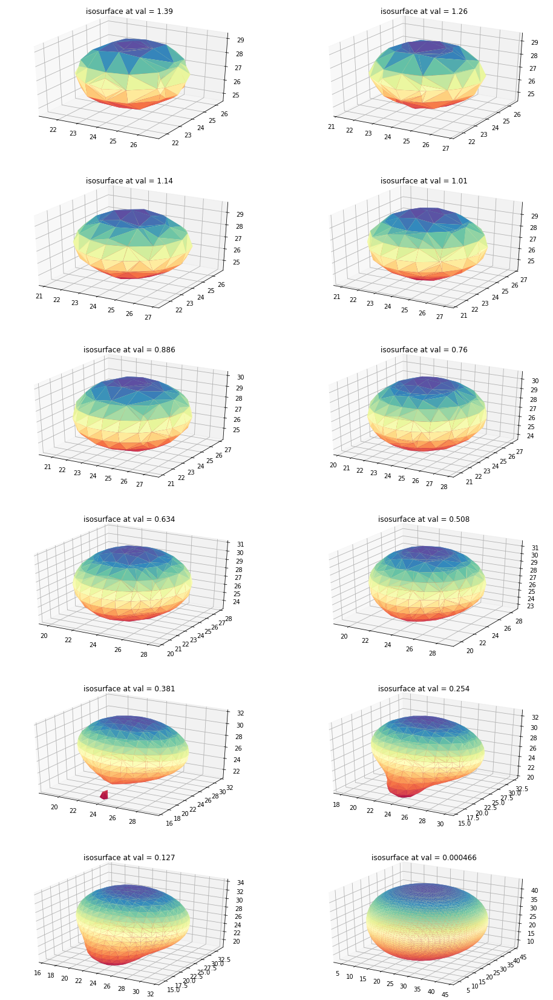

In [144]:
figWaterGPAW_rhoDescending = isosurfCubeLog('examples/h2o.rho.cube',sign=-1,margin=1e-6,interval=[0.997,1],sections=12)

## Amber water example, potential

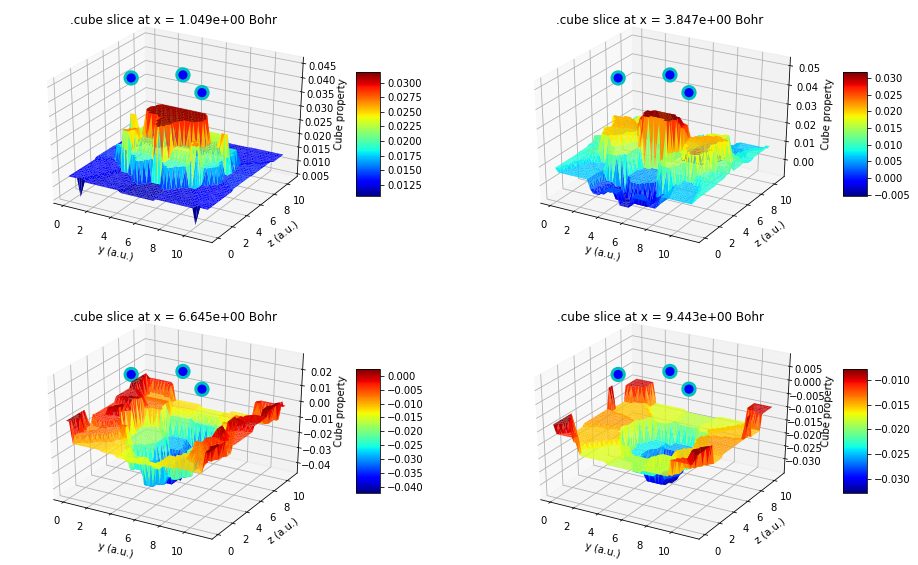

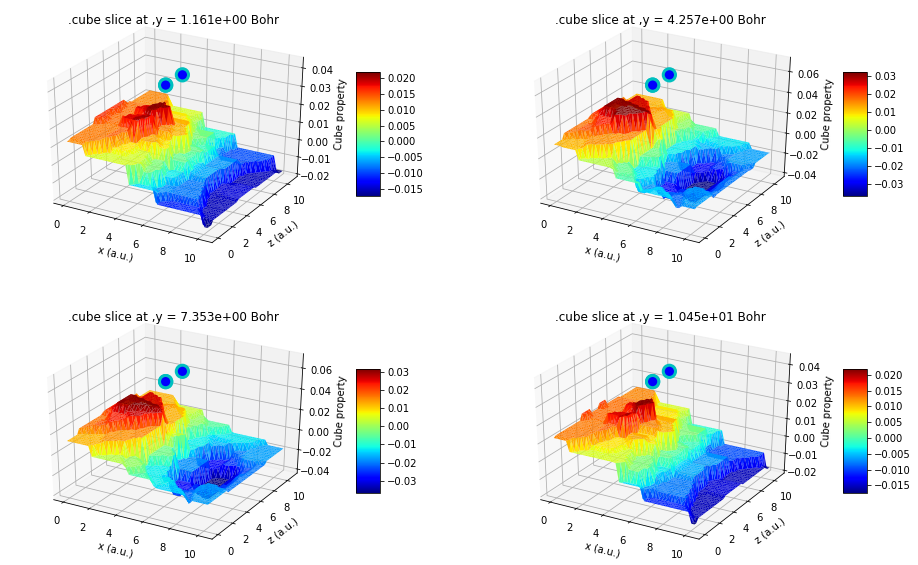

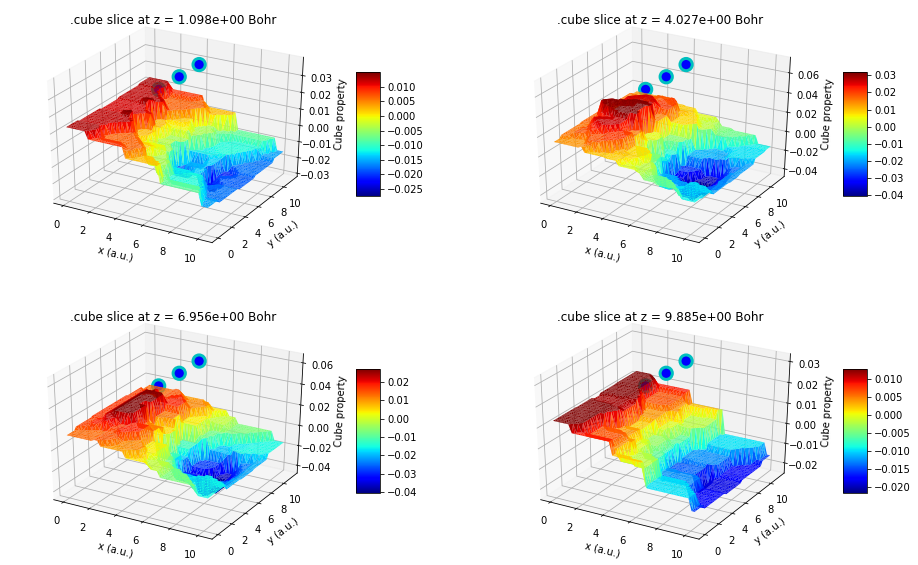

In [145]:
figAmberWater = sliceCubeXYZ('sandbox/esp_wat.gesp.cube.99999',sections=4) # 4 sections in each spatial dimension
 

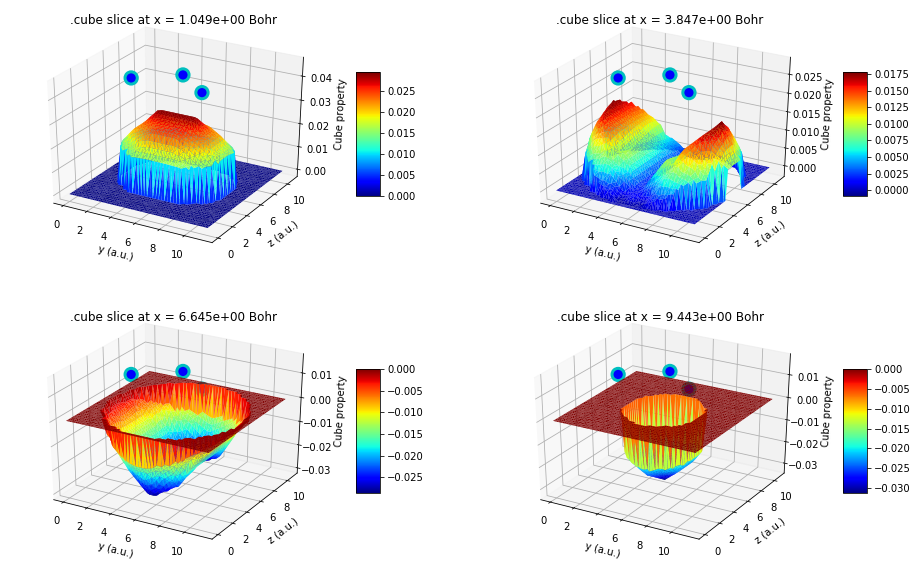

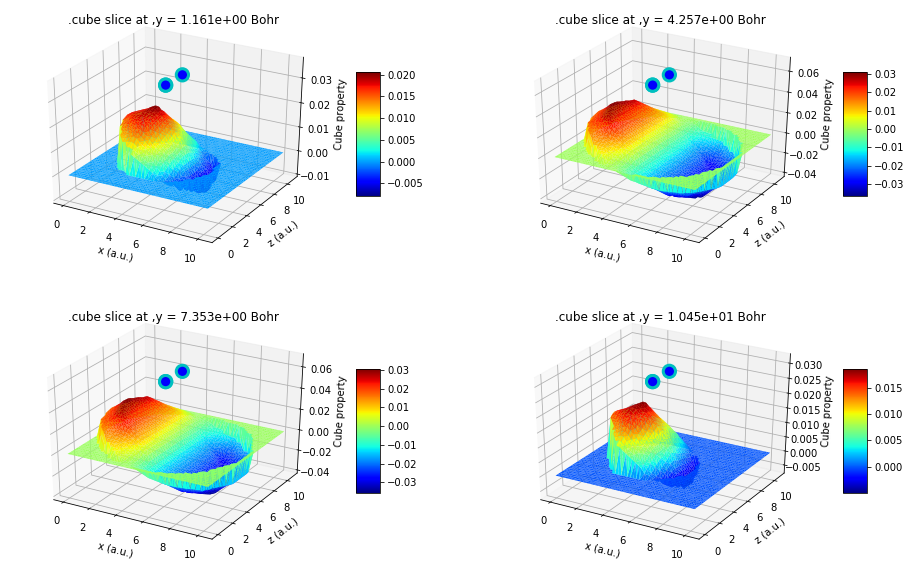

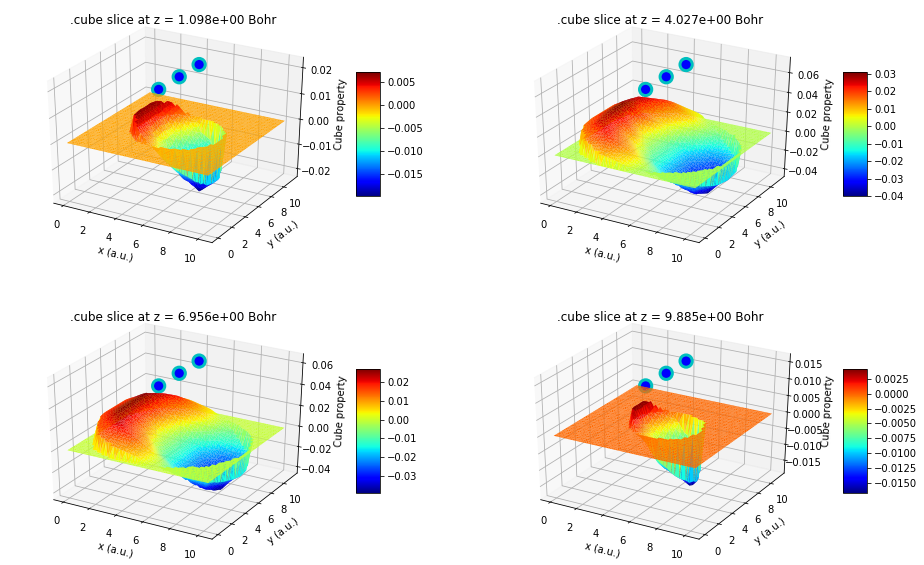

In [146]:
figAmberWaterLin = sliceCubeXYZ('sandbox/esp_wat.gesp.cube.99999.lin',sections=4)


In [ ]:
figAmberWaterLin = sliceCubeXYZ('sandbox/esp_wat.gesp.cube.99999.lin')


Data maximum 0.03164829.
Data minimum -0.04137025.
Span of data 0.07301853999999999.
Shift data by -1.04137025.
Span of logarithms: 0.030607225926932352.
Magnitude of logarithm: 0.030607225926932352.
Plot isosurfaces of normalized log values in interval [0.0, 1.0]


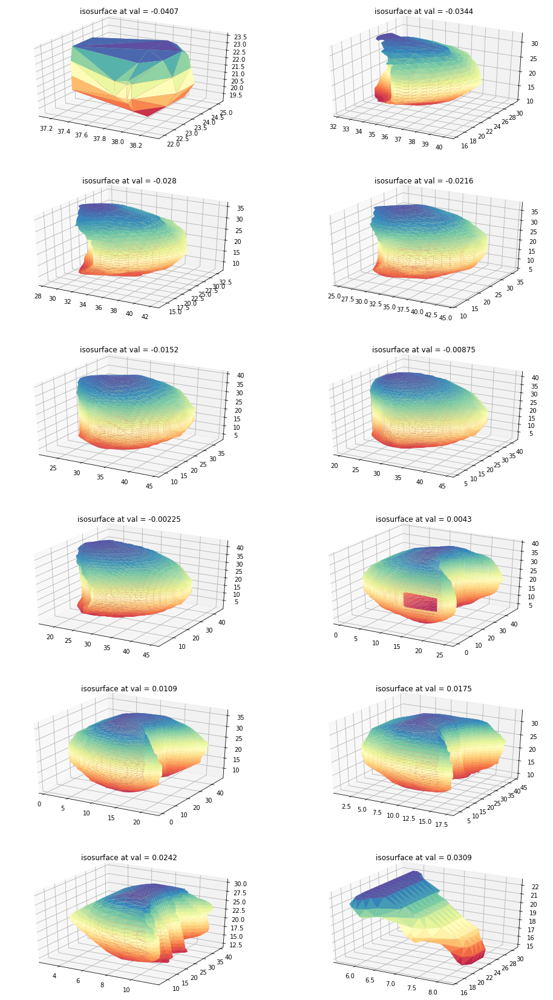

In [148]:
figAmberWaterIsopotentials = isosurfCubeLog('sandbox/esp_wat.gesp.cube.99999.lin',sections=12)

Data maximum 0.04137025.
Data minimum -0.03164829.
Span of data 0.07301853999999999.
Shift data by -1.03164829.
Span of logarithms: 0.0306072259269324.
Magnitude of logarithm: 0.030607225926932352.
Plot isosurfaces of normalized log values in interval [-1.5753264749562651e-15, 1.0]


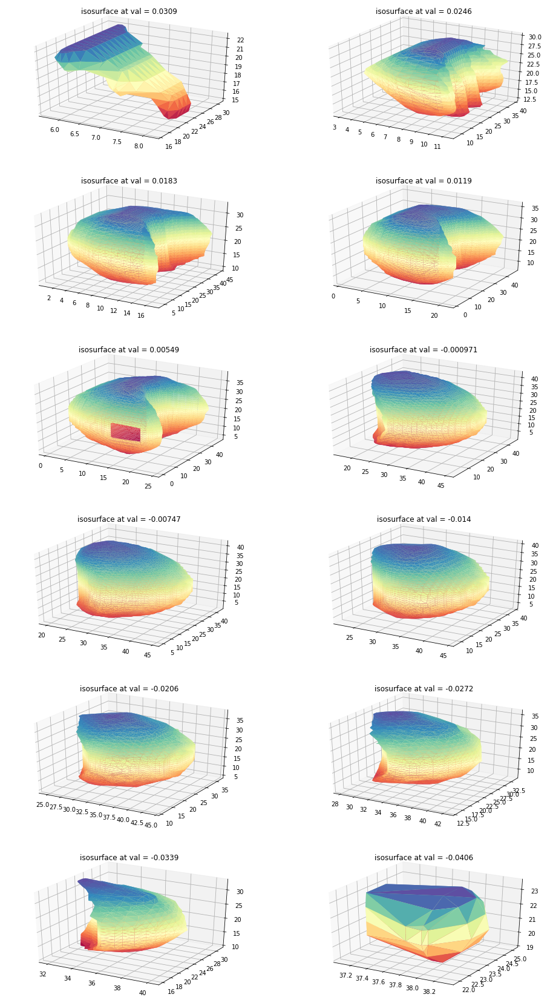

In [149]:
figAmberWaterIsopotentials = isosurfCubeLog('sandbox/esp_wat.gesp.cube.99999.lin',sections=12,sign=-1)

## SMAMP, example

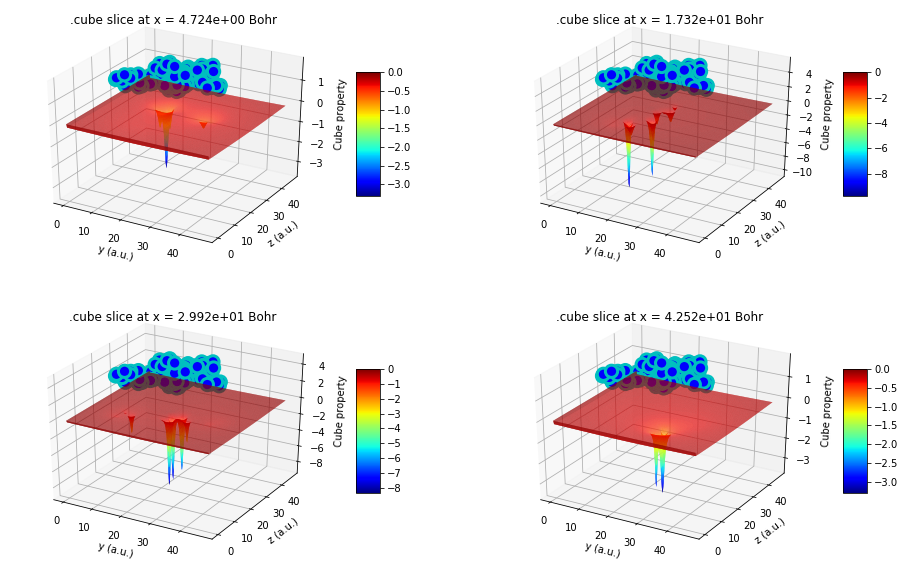

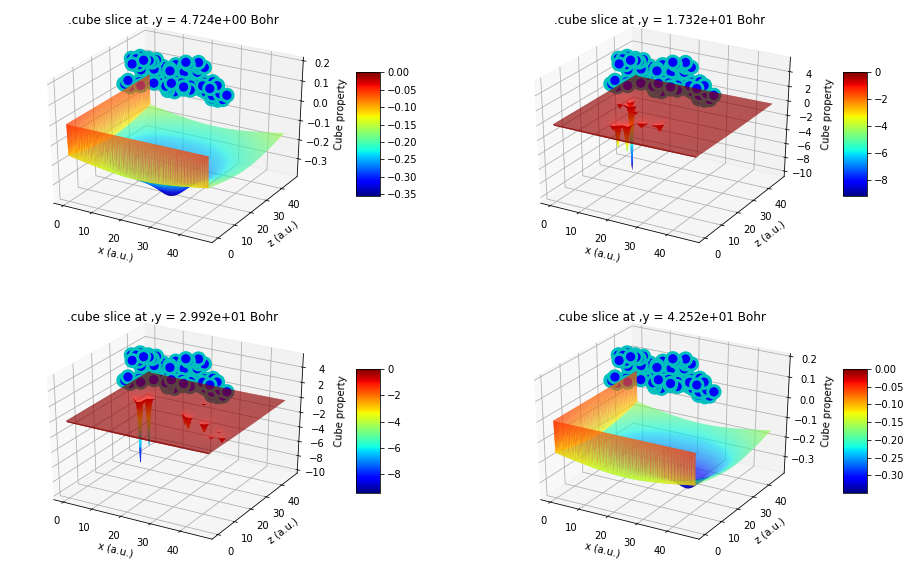

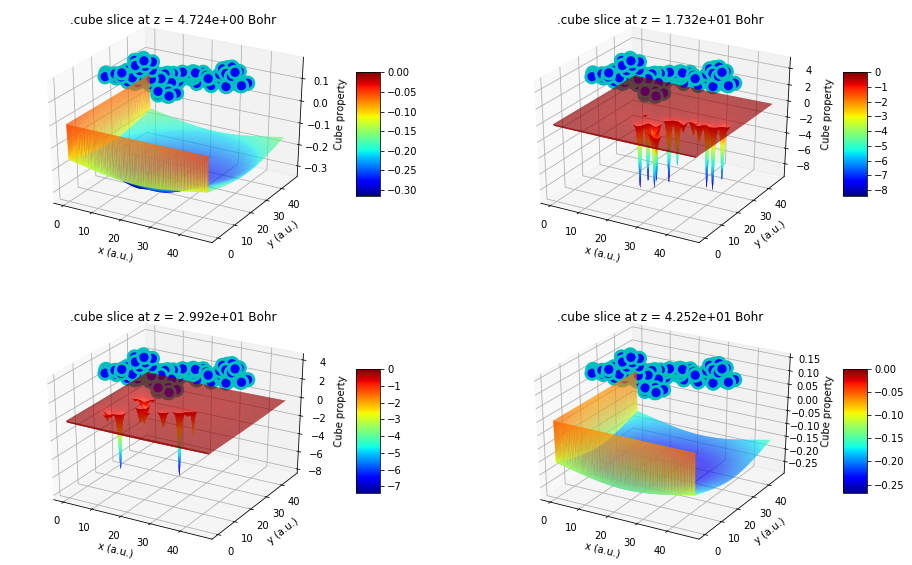

In [151]:
figESPSmampSlices = sliceCubeXYZ('sandbox/esp_smamp.cube',sections=4) # 4 sections in each spatial dimension

Data maximum 0.0.
Data minimum -11.73905.
Span of data 11.73905.
Shift data by -12.73905.
Span of logarithms: 1.1051370421954652.
Magnitude of logarithm: 1.1051370421954652.
Plot isosurfaces of normalized log values in interval [0.0, 1.0]


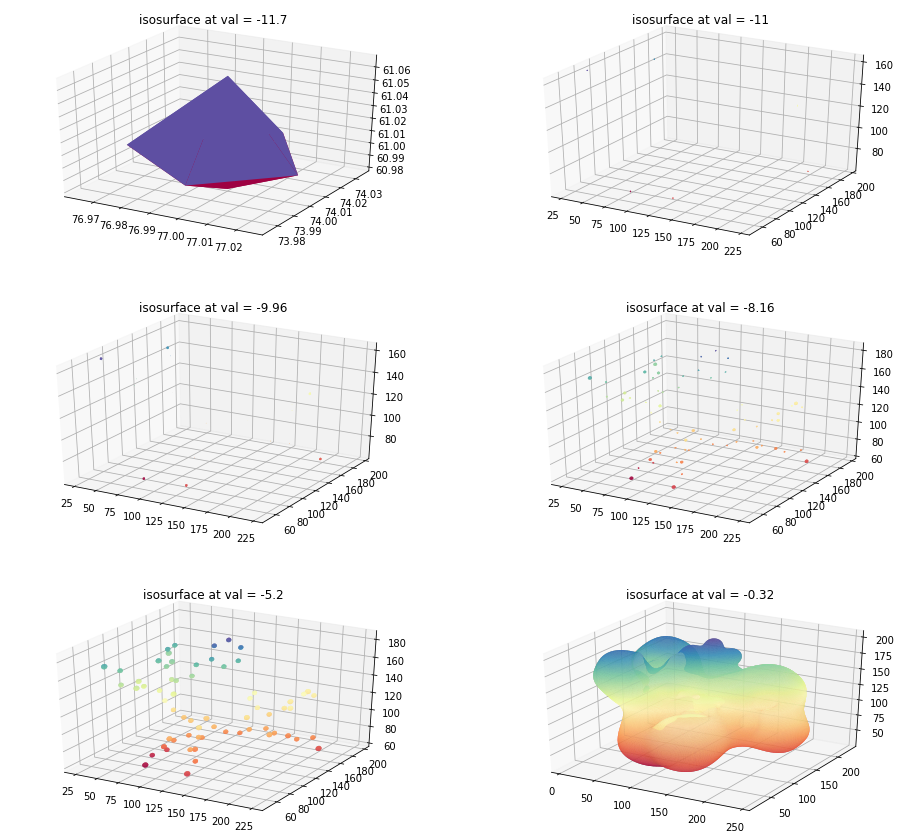

In [152]:
figESPSmampIsopotentials = isosurfCubeLog('sandbox/esp_smamp.cube')

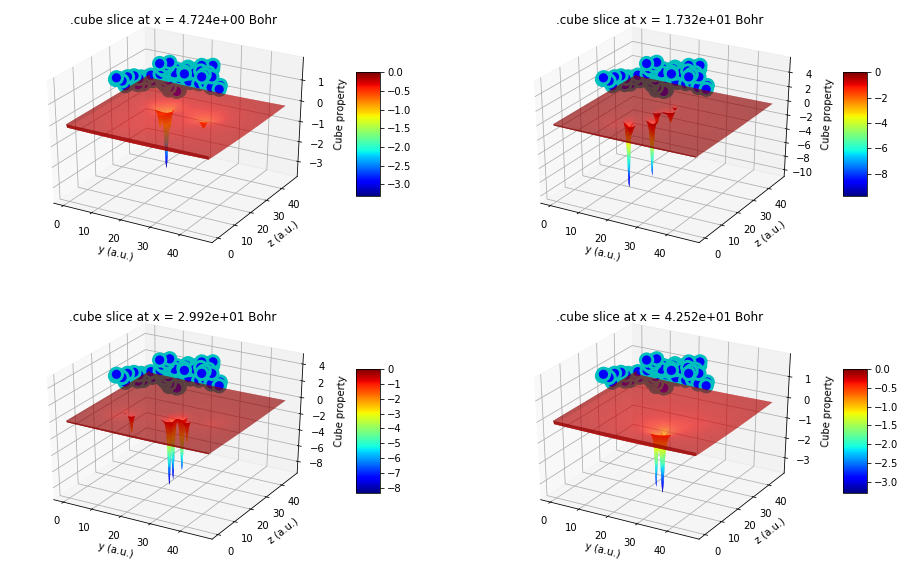

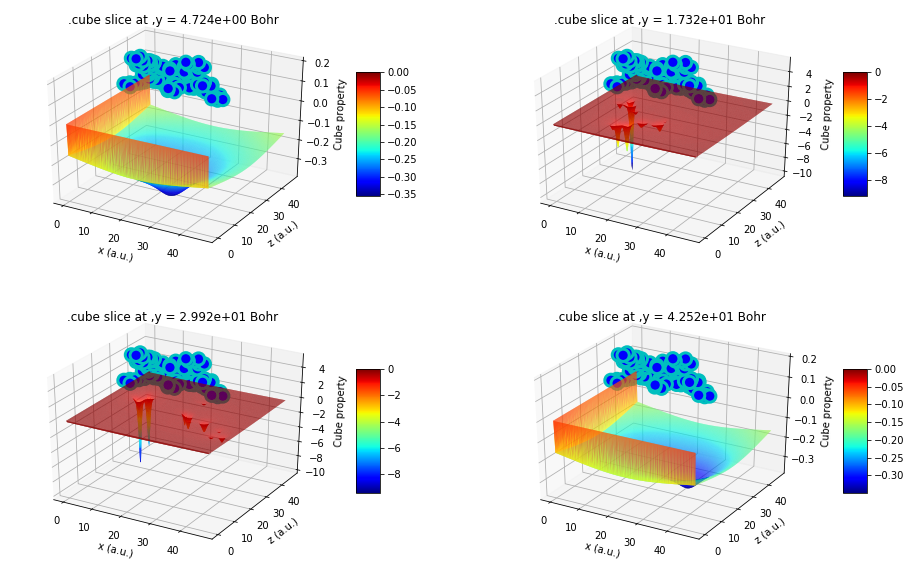

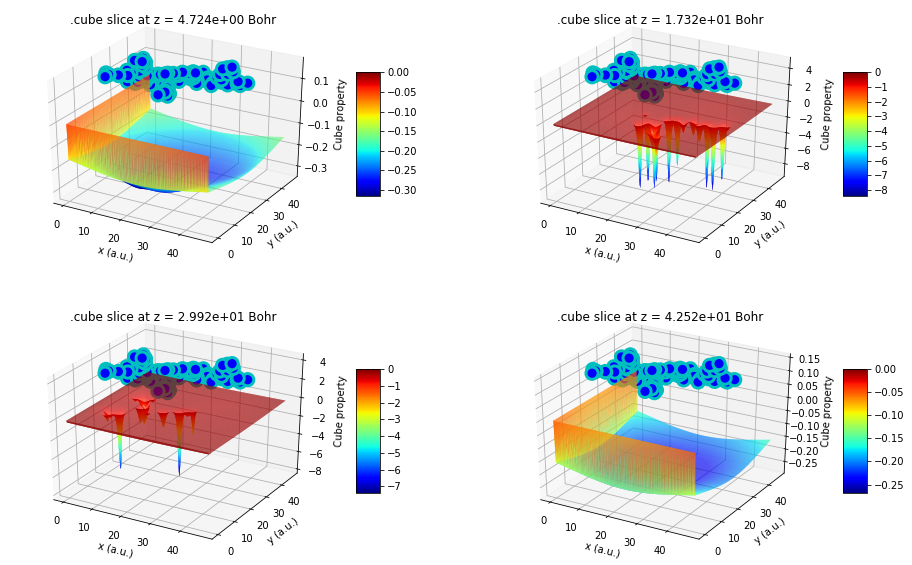

In [153]:
figESPuaSmampSlices = sliceCubeXYZ('sandbox/esp_smamp_ua.cube',sections=4) 

Data maximum 0.0.
Data minimum -11.73905.
Span of data 11.73905.
Shift data by -12.73905.
Span of logarithms: 1.1051370421954652.
Magnitude of logarithm: 1.1051370421954652.
Plot isosurfaces of normalized log values in interval [0.0, 1.0]


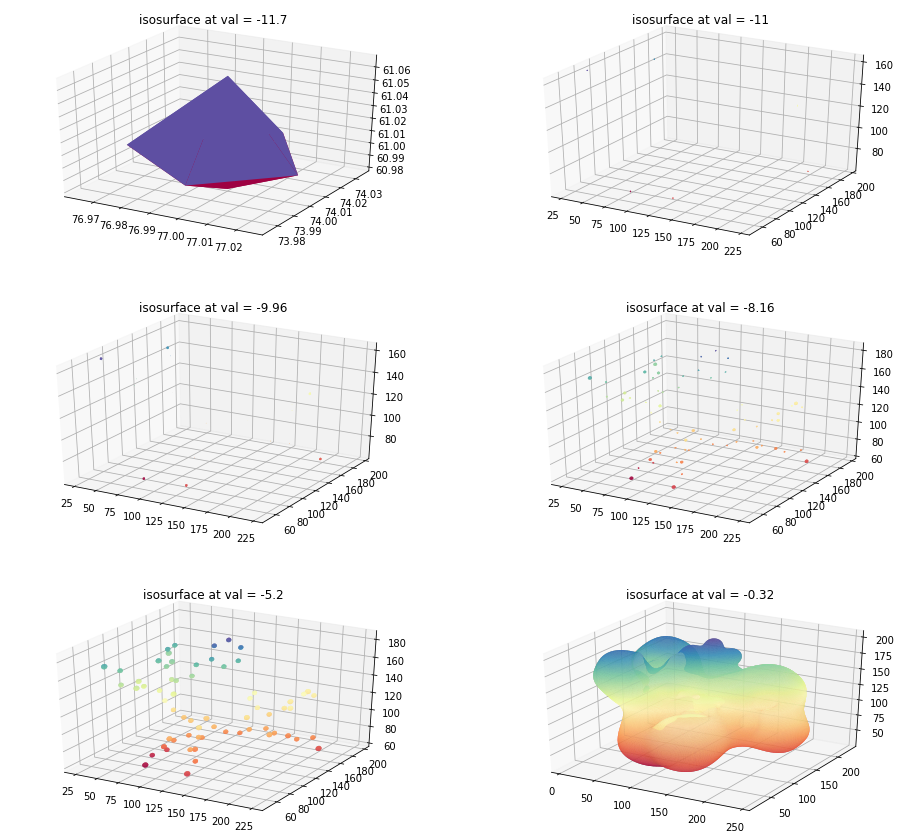

In [154]:
figESPuaSmampIsopotentials = isosurfCubeLog('sandbox/esp_smamp_ua.cube')